# THOR dataloader for Sentinel 2 data 'standalone' example

If you don't want to install the full thor package, install the required packages and add the directory of the thor repo to the python path

## reqs
```bash
pip install torch torchvision numpy tqdm xarray pandas netcdf4 h5netcdf matplotlib geopandas pyproj shapely ipykernel rioxarray rasterio geojson ipywidgets timm pytorch_lightning lightning
```

In [1]:
import sys

# Change this to the path of the directory of the thor project
sys.path.append("..")

In [2]:
import random

import numpy as np
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm

from thor.data.thor_footprint_builder import FootprintBuilder
from thor.data.thor_iterable_dataset_v2 import THORIterableDatasetV2

/home/theodor/Projects/THOR/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/theodor/Projects/THOR/.venv/lib/python3.13/site-packages/timm/models/helpers.py:7: FutureWarning: Importing from timm.models.helpers is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/home/theodor/Projects/THOR/.venv/lib/python3.13/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [3]:
seed = 42


def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

# Setup config

We use the same config for building the footprint cache and the actual dataset.

Here we specify the path to the data, the products we want to use and the ground cover the crops should have.

In [4]:
dataset_cfg = {
    "paths": "/nr/bamjo/jodata5/pro/fm4cs/data/lumi/v6_all",
    "split": None,  # train
    "ground_covers": [3000],  # m
    "sample_ratio": 1.0,
    "data_percent": 0.05,
    "resize": True,
    "include_filter": None,  # Optional filter for including only certain tiles, file with each line being a tile name TXXXXX, or tile name and date TXXXXX/YYYY/MM/DD
    "exclude_filter": None,  # Optional filter for excluding certain tiles, same format as include_filter
    "important_products": ["S2"],
    "products": {
        "S2-10m": None,
        "S2-20m": None,
        "S2-60m": None,
    },
}

# Build the footprint index

In [ ]:
save_fig = False  # True to create and save footprint figures
overwrite = False  # True to overwrite existing metadata cache files
num_workers = 4

footprint_builder = FootprintBuilder(**dataset_cfg, save_fig=save_fig, overwrite=overwrite)

footprint_dataloader = DataLoader(
    dataset=footprint_builder,
    batch_size=1,
    shuffle=False,
    collate_fn=footprint_builder.collate_fn,
    num_workers=num_workers,
    drop_last=False,
)

misses = 0
misses_files = []
found_files = []

for sample in tqdm(footprint_dataloader, total=len(footprint_dataloader), desc="Building dataset"):
    file_path, gdf, total_area, success = sample[0]
    if not success:
        misses += 1
        misses_files.append(str(file_path))
    else:
        found_files.append(str(file_path))


print(f"Misses: {misses}, {misses / len(footprint_dataloader) * 100:.2f}%")
print(f"Misses files: {misses_files}")
print("===============================")
print(f"Found {len(found_files)} files")

# Load dataset
Please note that the dataset takes cares of creating batches, therefore we set the batch size to None in the dataloader

In [6]:
num_workers = 4
batch_size = 16

dataset = THORIterableDatasetV2(**dataset_cfg, batch_size=batch_size)

g = torch.Generator()
g.manual_seed(seed)

if num_workers == 0:
    seed_worker(seed)

dataloader = DataLoader(
    dataset,
    batch_size=None,
    collate_fn=dataset.collate_fn,
    shuffle=False,
    num_workers=num_workers,
    prefetch_factor=1 if num_workers > 0 else None,
    worker_init_fn=seed_worker,
    generator=g,
)

INFO:thor.data.thor_dataset_base:################################################################################
INFO:thor.data.thor_dataset_base:Ground cover products:
INFO:thor.data.thor_dataset_base:  3000  m: ['S2-10m', 'S2-20m', 'S2-60m']
INFO:thor.data.thor_dataset_base:################################################################################
INFO:thor.data.thor_dataset_base:products: ['S2-10m', 'S2-20m', 'S2-60m']
INFO:thor.data.thor_dataset_base:product changes: {'S2-10m': 'S2-10m', 'S2-20m': 'S2-20m', 'S2-60m': 'S2-60m'}
INFO:thor.data.thor_dataset_base:important products: ['S2']
INFO:thor.data.thor_dataset_base:largest to smallest gsd products: ['S2-60m', 'S2-20m', 'S2-10m']
INFO:thor.data.thor_dataset_base:Split: None
INFO:thor.data.thor_dataset_base:Ground covers: [3000]
INFO:thor.data.thor_dataset_base:building transforms for ground cover: 3000
INFO:thor.data.thor_dataset_base:ground cover: 3000, img_sizes: [50, 150, 300]
INFO:thor.data.thor_dataset_base:transforms

Sizes: [(50, 50), (150, 150), (300, 300)], smallest size: 50


Loading files: 18320it [00:41, 437.38it/s]
INFO:thor.data.thor_dataset_base:missing product stats: Counter()
INFO:thor.data.thor_iterable_dataset_v2:Loaded 1 files for split 'None'


# Plot some samples

Plotting dataset:   0%|          | 0/10 [00:00<?, ?it/s]INFO:thor.data.thor_iterable_dataset_v2:Shuffling file paths for epoch 0 with random seed 42
INFO:thor.data.thor_iterable_dataset_v2:Using simple sampling for epoch 0 with random seed 42
INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.6800,   41.7200],
        [-119.6200,   42.0000]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Batch example:
Batch: 0 batch size: 16
Bands: ['S2:CoastAerosal', 'S2:WaterVapor', 'S2:RE1', 'S2:RE2', 'S2:RE3', 'S2:RE4', 'S2:SWIR1', 'S2:SWIR2', 'S2:Blue', 'S2:Green', 'S2:Red', 'S2:NIR']
Band: S2:CoastAerosal, shape: torch.Size([16, 1, 50, 50])
Band: S2:WaterVapor, shape: torch.Size([16, 1, 50, 50])
Band: S2:RE1, shape: torch.Size([16, 1, 150, 150])
Band: S2:RE2, shape: torch.Size([16, 1, 150, 150])
Band: S2:RE3, shape: torch.Size([16, 1, 150, 150])
Band: S2:RE4, shape: torch.Size([16, 1, 150, 150])
Band: S2:SWIR1, shape: torch.Size([16, 1, 150, 150])
Band: S2:SWIR2, shape: torch.Size([16, 1, 150, 150])
Band: S2:Blue, shape: torch.Size([16, 1, 300, 300])
Band: S2:Green, shape: torch.Size([16, 1, 300, 300])
Band: S2:Red, shape: torch.Size([16, 1, 300, 300])
Band: S2:NIR, shape: torch.Size([16, 1, 300, 300])
Plotting batch 0


/home/theodor/Projects/THOR/.venv/lib/python3.13/site-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


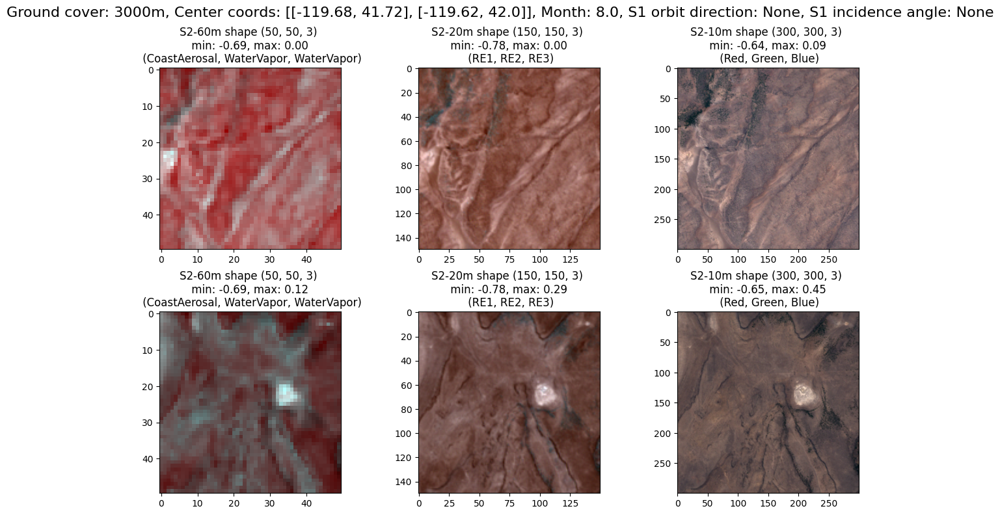

Plotting dataset:  10%|█         | 1/10 [00:03<00:28,  3.11s/it]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.8300,   41.6200],
        [-119.7800,   41.4800]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 1


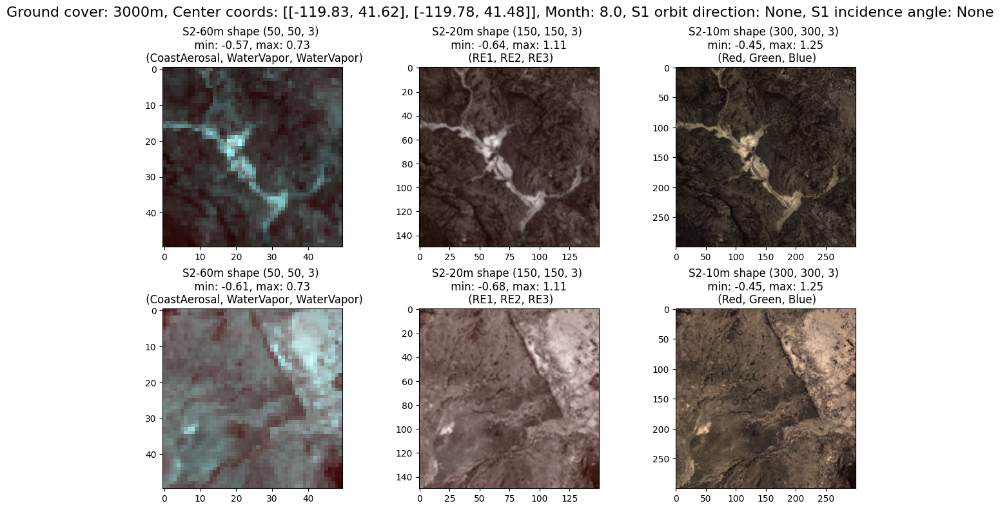

Plotting dataset:  20%|██        | 2/10 [00:03<00:12,  1.58s/it]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.7300,   41.6800],
        [-119.6600,   41.7400]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 2


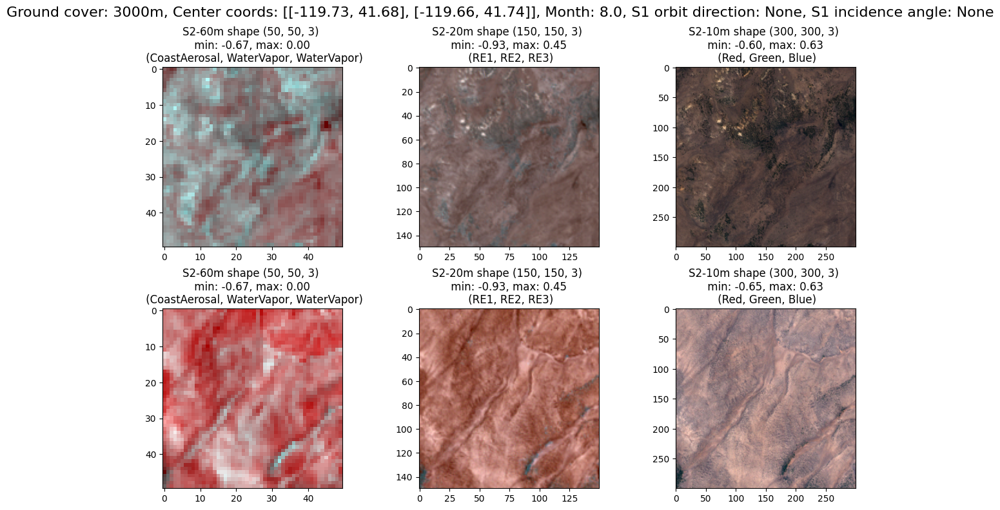

Plotting dataset:  30%|███       | 3/10 [00:04<00:07,  1.09s/it]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.7300,   41.8500],
        [-119.7300,   41.7700]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 3


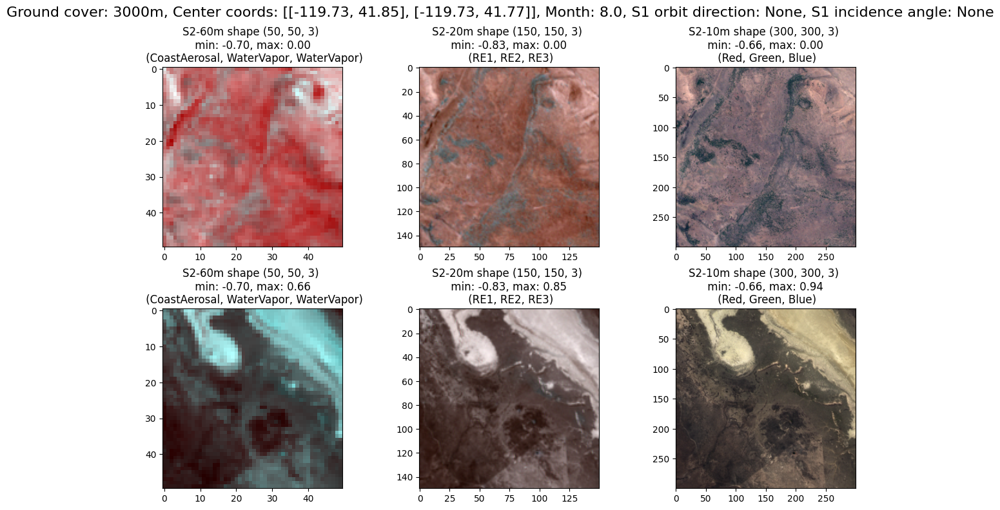

Plotting dataset:  40%|████      | 4/10 [00:04<00:05,  1.15it/s]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.6800,   41.7200],
        [-119.6200,   42.0000]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 4


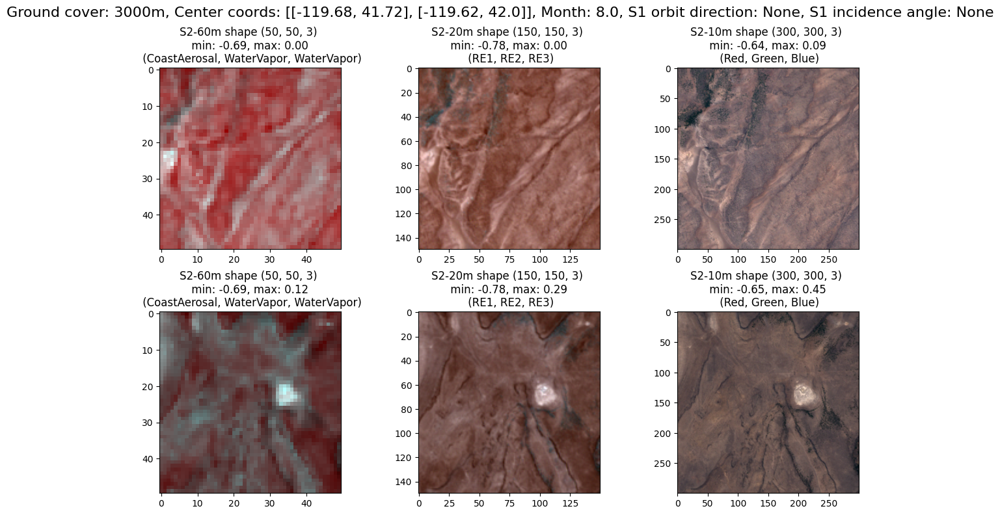

Plotting dataset:  50%|█████     | 5/10 [00:05<00:04,  1.09it/s]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.8300,   41.6200],
        [-119.7800,   41.4800]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 5


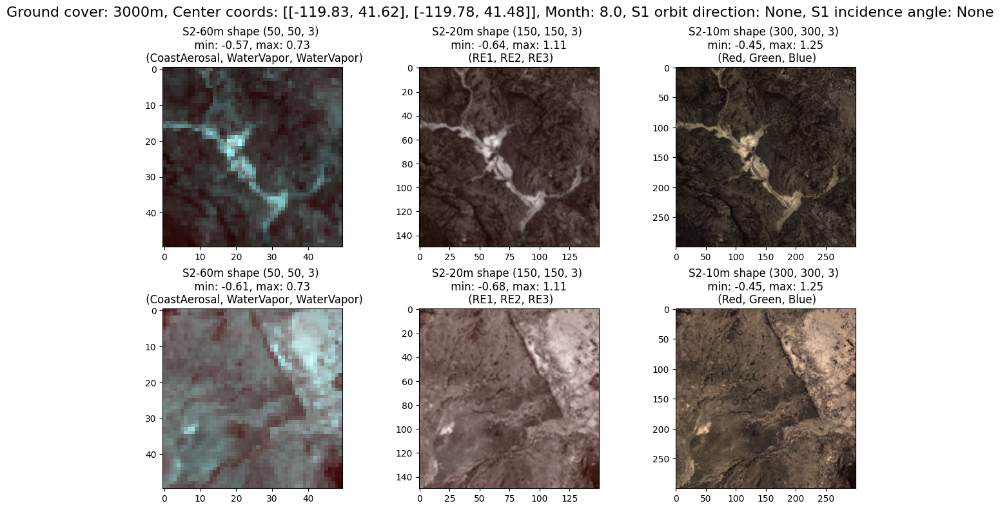

Plotting dataset:  60%|██████    | 6/10 [00:06<00:03,  1.02it/s]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.7300,   41.6800],
        [-119.6600,   41.7400]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 6


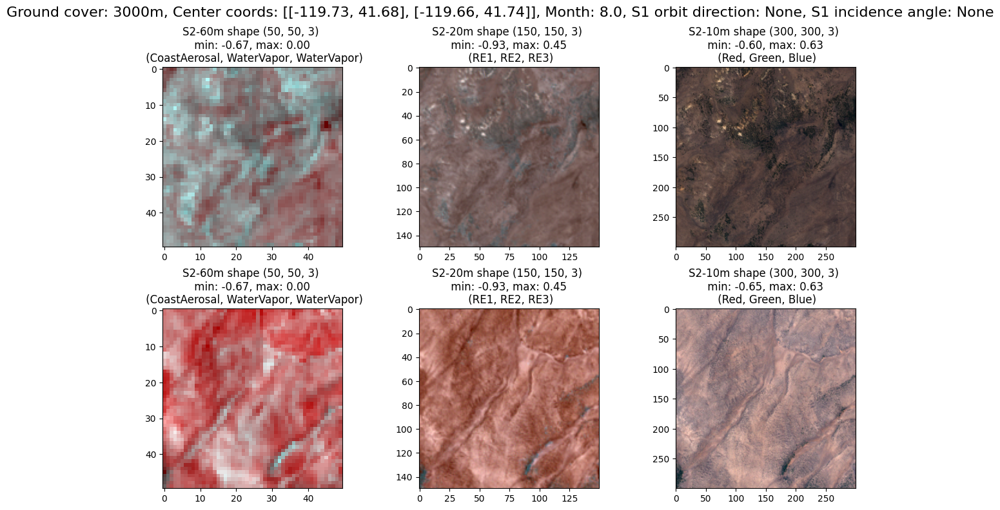

Plotting dataset:  70%|███████   | 7/10 [00:07<00:02,  1.20it/s]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.7300,   41.8500],
        [-119.7300,   41.7700]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 7


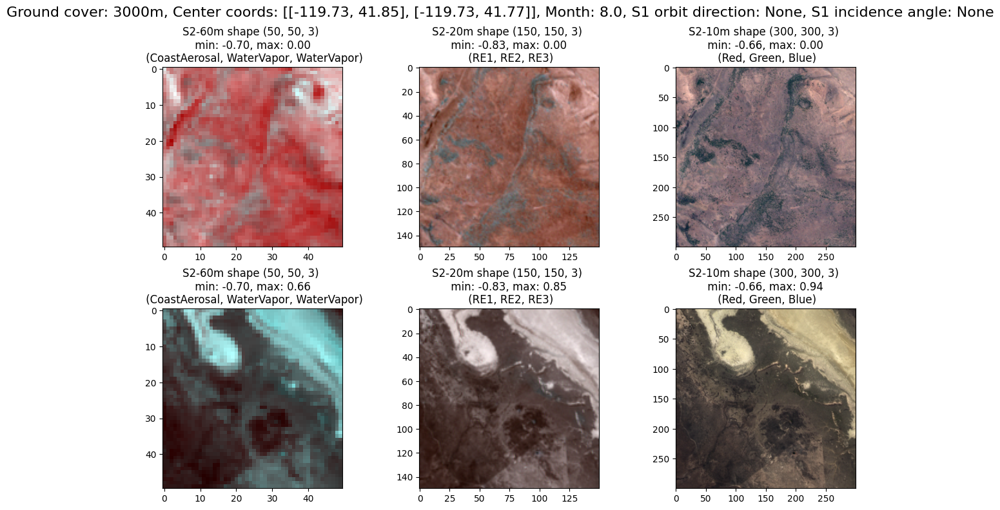

Plotting dataset:  80%|████████  | 8/10 [00:08<00:01,  1.24it/s]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.6800,   41.7200],
        [-119.6200,   42.0000]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 8


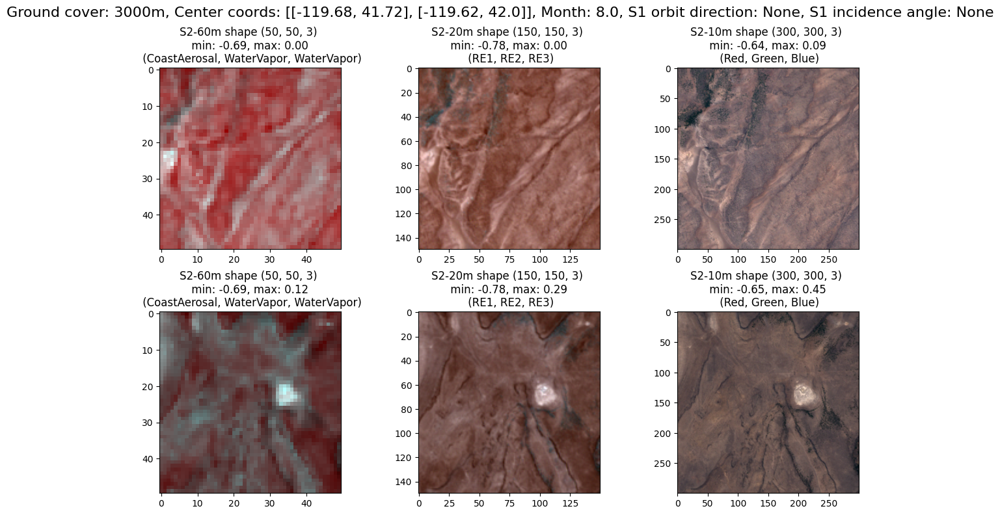

Plotting dataset:  90%|█████████ | 9/10 [00:08<00:00,  1.25it/s]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.8300,   41.6200],
        [-119.7800,   41.4800]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 9


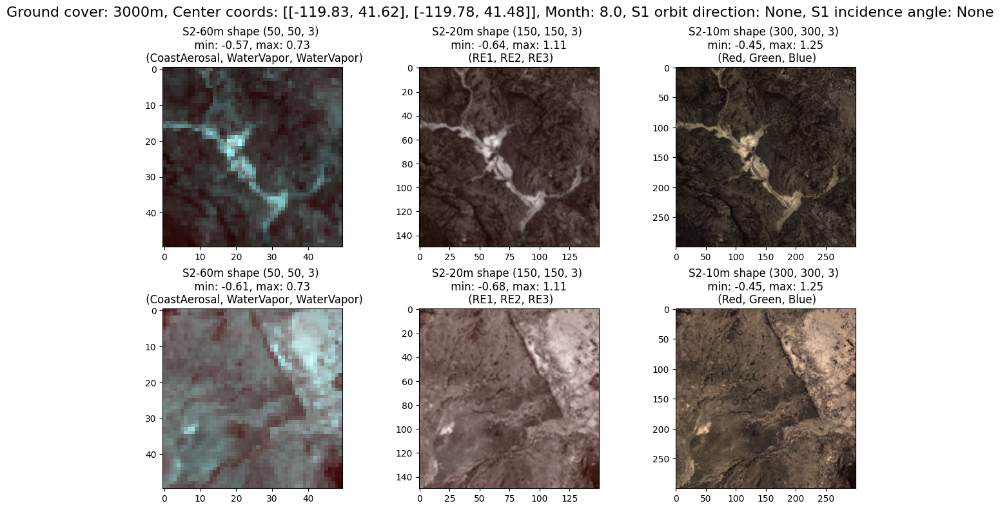

Plotting dataset: 100%|██████████| 10/10 [00:10<00:00,  1.07s/it]INFO:thor.data.thor_dataset_base:ground cover: 3000, center coords: tensor([[-119.7300,   41.6800],
        [-119.6600,   41.7400]], dtype=torch.float64), month: 8.0, s1 orbit direction: None, s1 incidence angle: None


Plotting batch 10


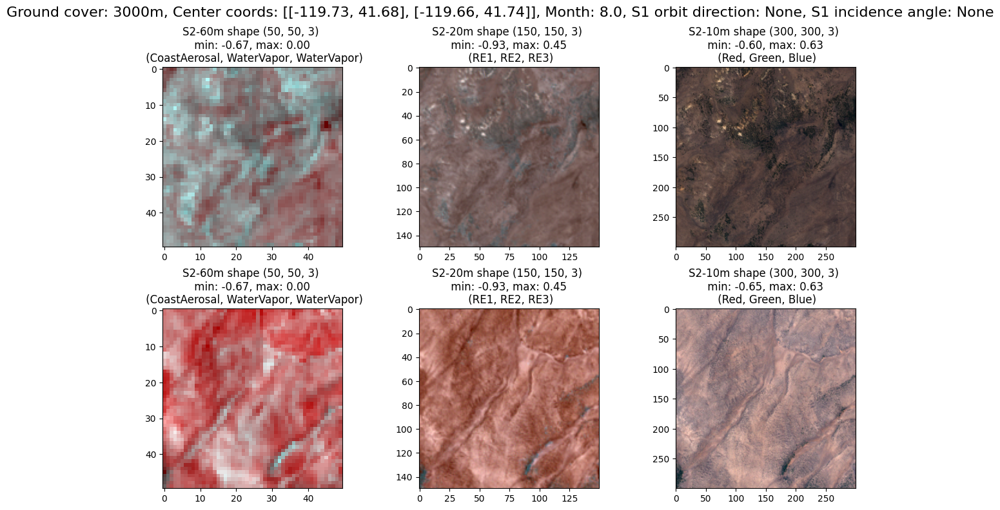

Stopping after 10 samples.


Plotting dataset: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]


In [7]:
n_samples = 10

for i_batch, sample_batched in enumerate(
    tqdm(dataloader, total=min(len(dataloader), n_samples), desc="Plotting dataset")
):
    if i_batch == 0:
        batch_size = next(iter(sample_batched.band_imgs.values())).shape[0]
        print("Batch example:")
        print(f"Batch: {i_batch} batch size: {batch_size}")
        print(f"Bands: {list(sample_batched.band_imgs.keys())}")
        keys = list(sample_batched.band_imgs.keys())
        for key in keys:
            print(f"Band: {key}, shape: {sample_batched.band_imgs[key].shape}")

    print(f"Plotting batch {i_batch}")
    dataset.plot(sample_batched.band_imgs, metadata=sample_batched.metadata, num_samples=2)

    if i_batch >= n_samples:
        print(f"Stopping after {n_samples} samples.")
        break